# Indoor Localisation Documentation

## Connect to EC2 Instance

### Pre-requisties:
- Ensure the EC2 instance is turned on
- Ensure you have the keypair (jerm2020_firstpair.pem)
- Domain name license is valid

### Procedure
- remote ssh into the EC2 instance by running 
    
    _ssh -i "Jermyn_secondpair2020.pem" ec2-user@ec2-52-77-184-100.ap-southeast-1.compute.amazonaws.com_
- Do ensure that you run this command in the same directory of the keypair

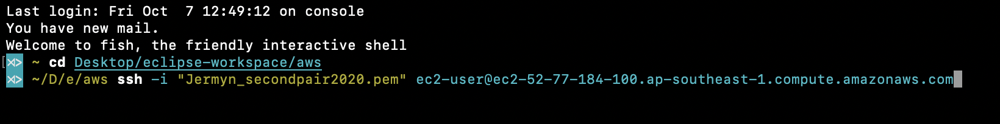

- You should see the following:

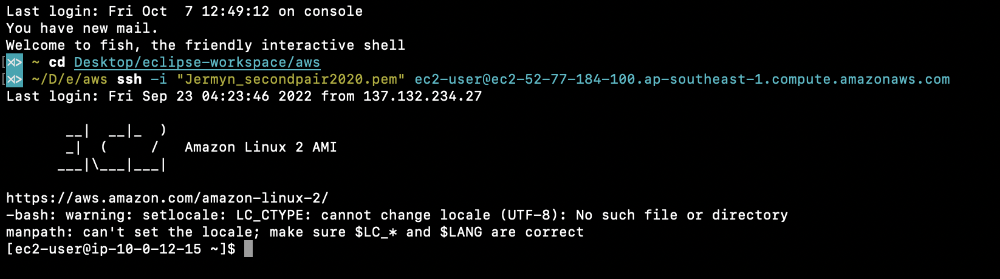

## Running all Server Scripts (if they are not run or have errors - can skip this if all are ok)

### Postgres Server
- Ensure AWS Postgres RDS is turned on
- run 

_pm2 start postgres_
- Check you can load loopback explorer and graphql
- run "52.77.184.100:3000/explorer" on the browser

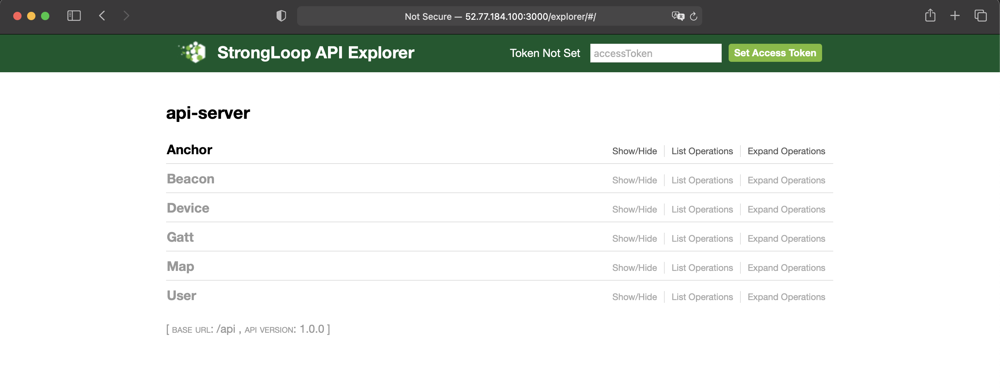

- type "52.77.184.100:3000/graphql" on the browser

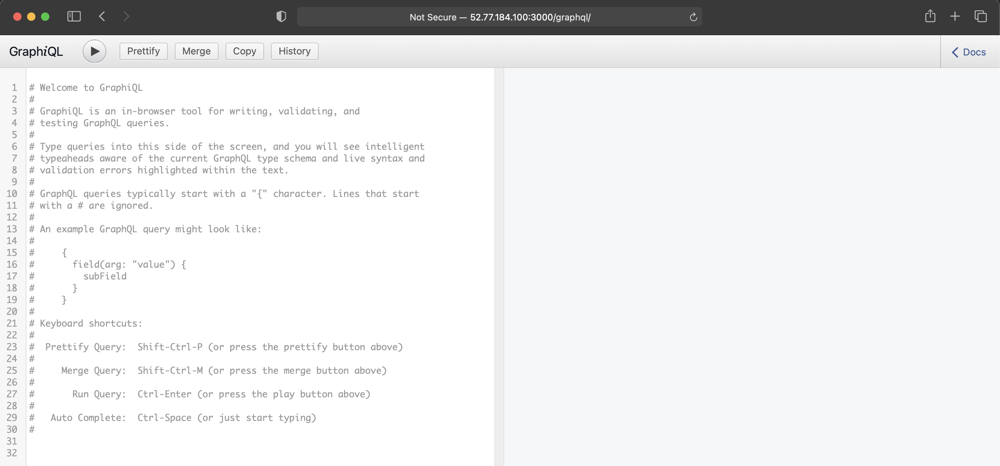

### Notification Server
- run 

_pm2 start coffee_
- Check that "server heartbeat" or some anchor status is being logged in the coffee logs
- Ensure no errors are being logged
- run 

_pm2 monit_

- and check the logs of coffee script

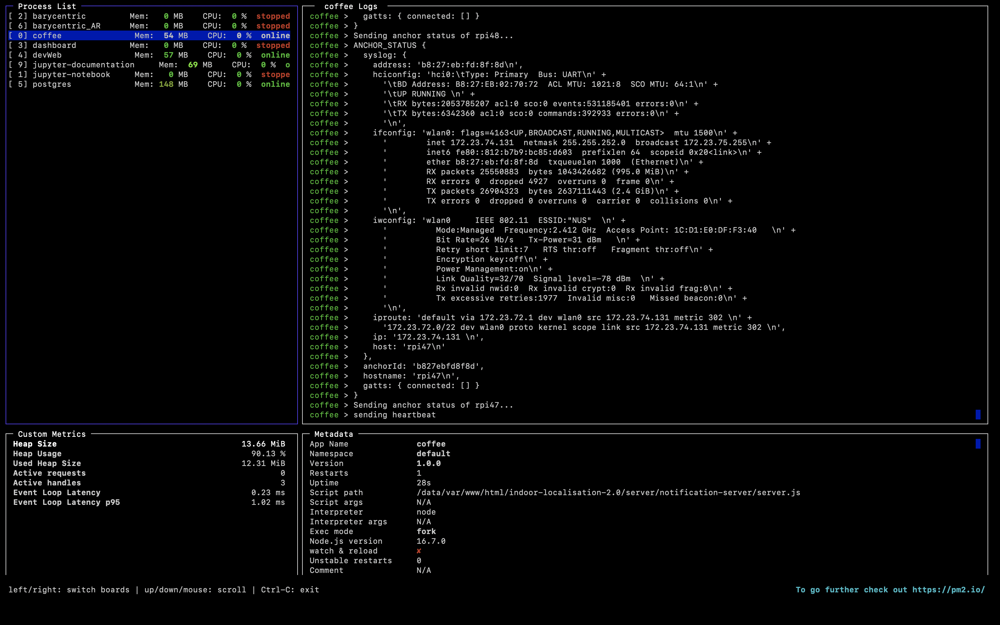

### Developer's Web Server
- run 

_pm2 start devWeb_
- Check the web server runs normally
- type "52.77.184.100:3001" on your browser to load the website

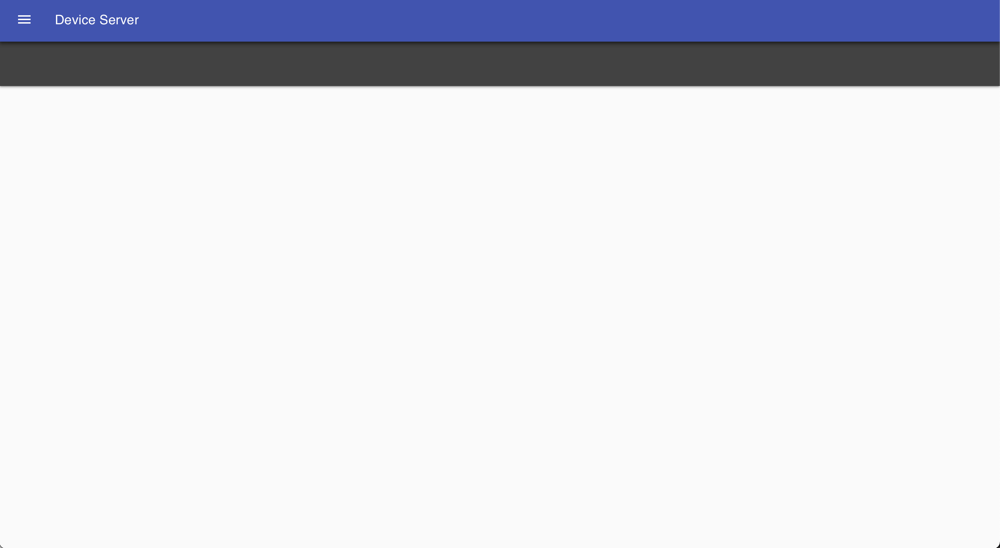

- check the devices page is load normally
- if this page is not loaded properly, it is either the RDS is not turned on or the web backend has some errors

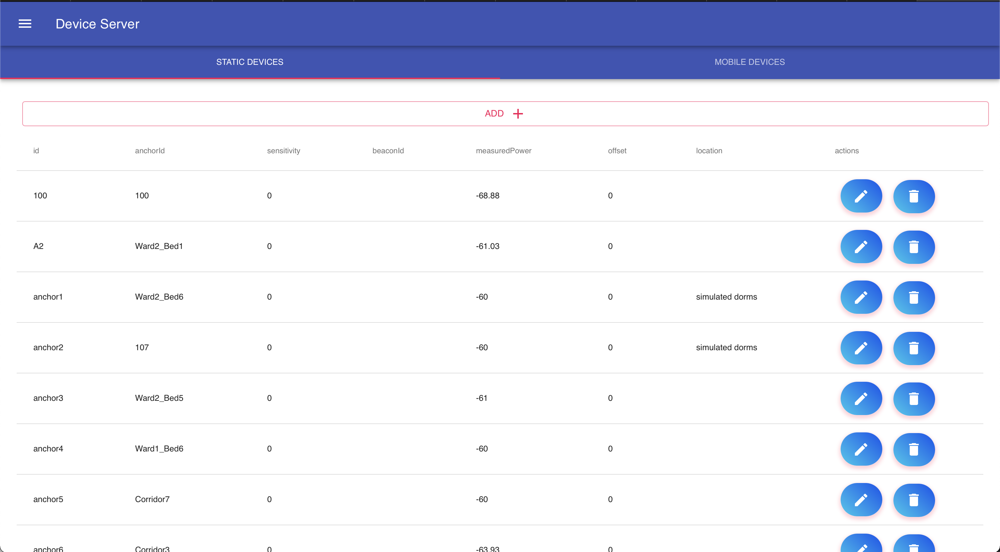

### ELK Server
- run 

_sudo systemctl start elasticsearch logstash kibana_
- check the status of each by running 

_sudo systemctl status elasticsearch logstash kibana_
- ensure all are running. They should state running with a green color indicator, as shown below

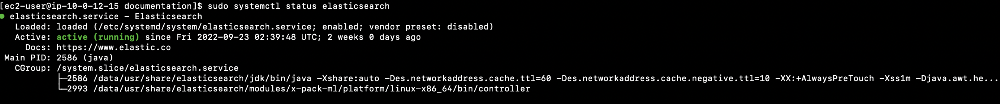

- check the kibana website to confirm the ELK server is running properly
- type "52.77.184.100:5601" in the browser

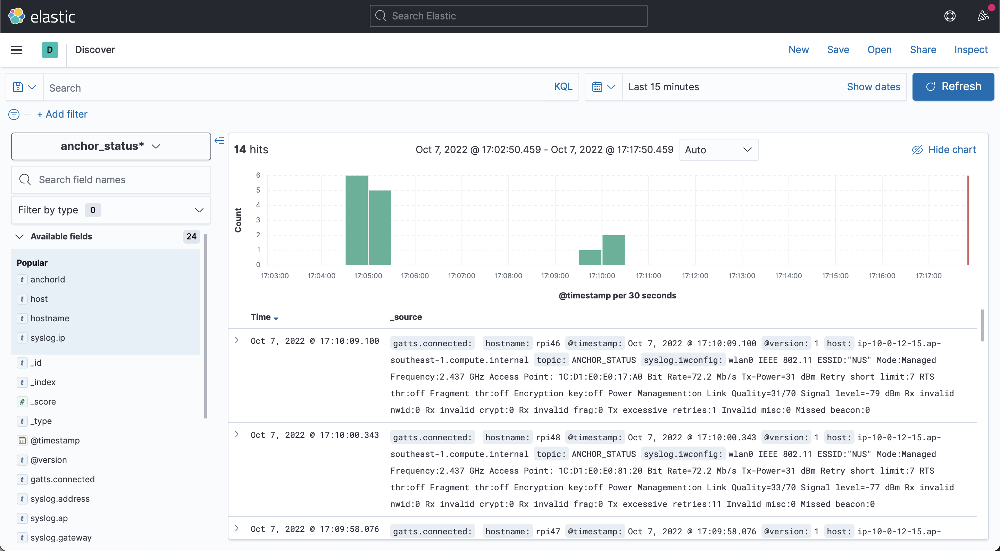

### Raspberry Pi
- enter into node_client directory
- run

_sudo systemctl start pulse_
- Check the rpis are detected by the server via the kibana->visualise->Anchor Status as shown below

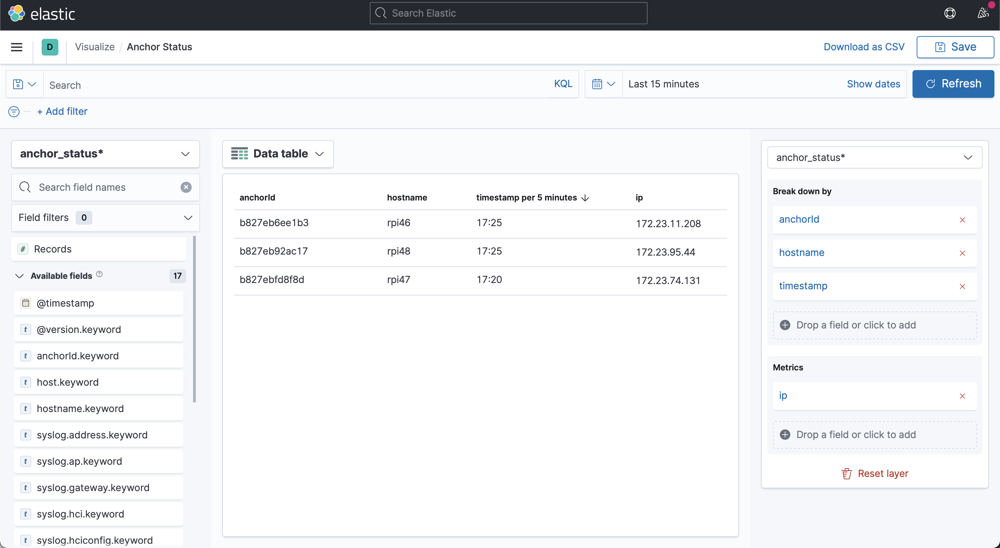

### Algorithm Server
- when the need arises to conduct localisation experiment, run 

_pm2 start barycentric_
- Do take note that algorithm server can only be run last, meaning all the above servers need to be running properly before this can be ran
- You can check the localisation results (Positioning or RSSI) in the kibana website

## Setting Up the Experiment

### Create Map - this is only required if there is a need to create a new map

- Navigate to the developer website (52.77.184.100:3001/Maps)
- Click on the top right button and click create
- Enter the map name in the id section and upload a PNG or JPG file
- For the scale section, leave it first and click create
- Once the map is created (you will know when the image you uploaded appear as a map), calculate the length or width of one side of the wall
- Use the measure feature to get the virtual length in radians and do a simple conversion to find the scale ratio of the physical:virtual length
- First click on the line option and draw a line that corresponds to the wall you are measuring
- Then click the measure tool (represented by 2)
- Take the phyiscal distance and divide by the radians value. The SI units should be in metres.
- Once you got the scale, click on the top right button and click Edit and insert the scale value in the scale text box

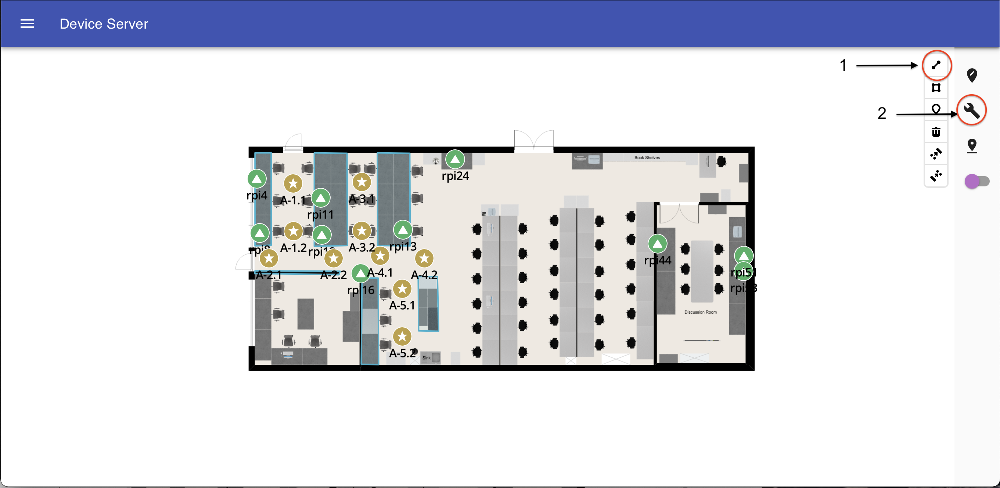

### Create Static Devices (Anchors/RPI) - this is only required if the anchor is not in the system yet
- Navigate to the developer website (52.77.184.100:3001/Devices)
- Click on Static Device Tab -> ADD and a dialog box will appear for you to fill in the required information

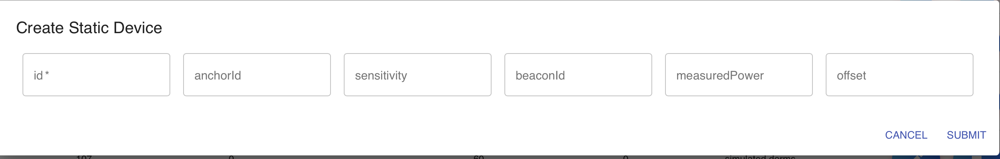

- Fill in the id and anchorId of the anchor
- id refers to the name of the anchor you would like to display on the map. AnchorId refers to the registered id, which is the mac address for the rpis
- An example of an anchor added is as follows:

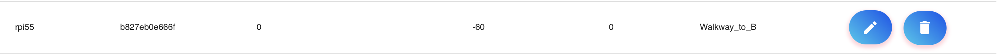

### Insert Static Devices into the map - this is required before running the localisation experiment

- Navigate to the Maps section (52.77.184.100:3001/Maps)
- Load Map
- Click on the marker option on the drawing tool and click on the location you want to place your anchor at in the map
- Following which click the Static Device option and select your anchor (If you can't find your anchor, it is either it have not been added to the system or it is placed in another map)
- If it is not added, add it to the devices page as seen above.
- If it is placed in another map, navigate to that map and remove the anchor

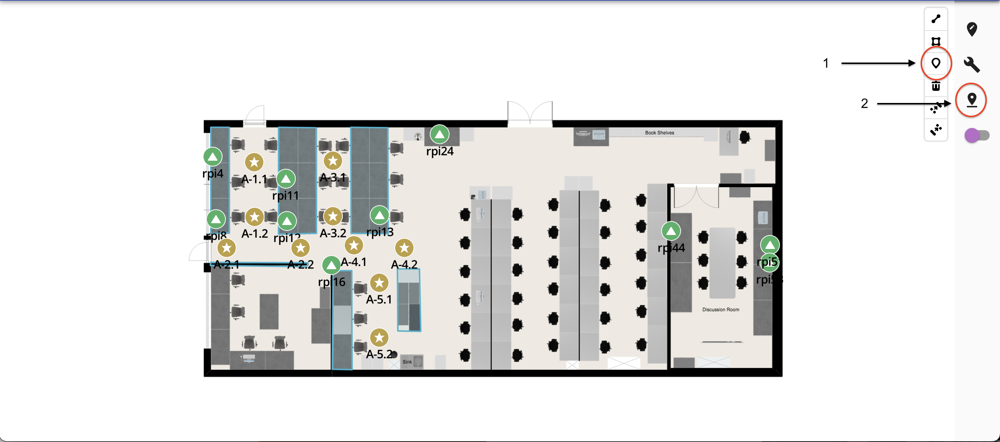

### Create Mobile Devices (Beacon) - this is only required if the beacon is not in the system yet
- Navigate to the developer website (52.77.184.100:3001/Devices)
- Click on Mobile Device Tab -> ADD and a dialog box will appear for you to fill in the required information

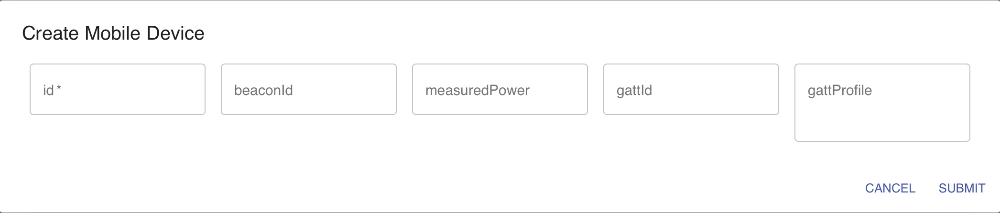

- Fill in the id and beaconid of the beacon. In some cases, you may need to fill in the measured power. 
- Same as anchors, the id is the name you want to see on the map. We categorise the beacons as b1, b2 etc.
- Measured Power is fixed at -60 if not filled in
- Beacon id is the id registered in the gimbal server (for the series 10 gimbal), and is usually the major:minor like 3:1, 3:2 etc
- If it is gatt sensors you would like to add, the beacon id is the mac address of the sensor (similar to the anchor set up)
- Do note that for gatt sensors, you will need to fill in the gattid (which is same as beaconId) and the gattProfile
- An example of gatt sensor and beacon will be shown below

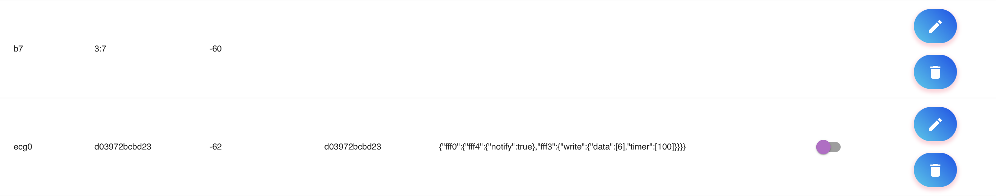

### Create Point of Interest (POI) - do this when you need some POI as some checkpoints or markers

- note that these points will not affect the experiment, they are just markers for post analysis
- Navigate to the developer website (52.77.184.100:3001) and click on the side bar to select Maps
- Load map (top-right button)
- Click the marker option on the drawing tool and place your POI point where you want on the map and give it a name

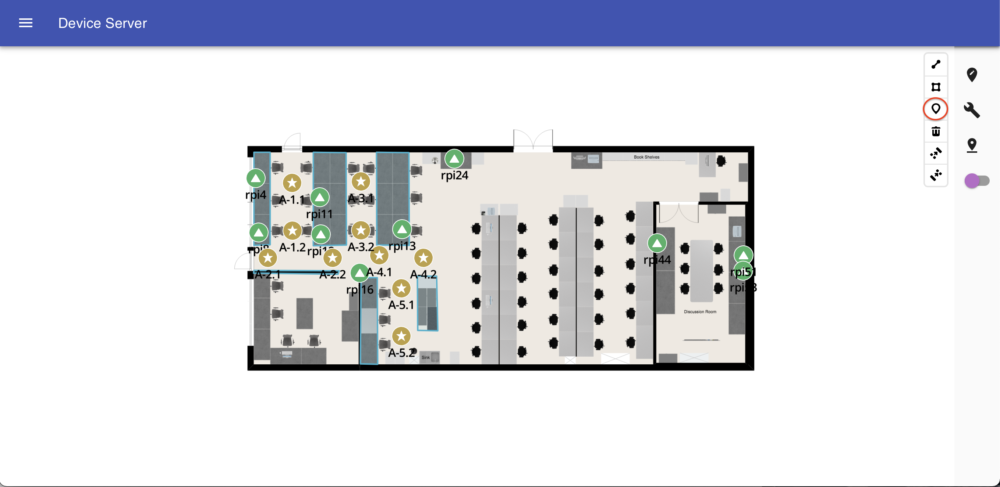

- You can then find the coordinates of the POI in the graphql
- Navigate to the graphql website (52.77.184.100:3000/graphql)

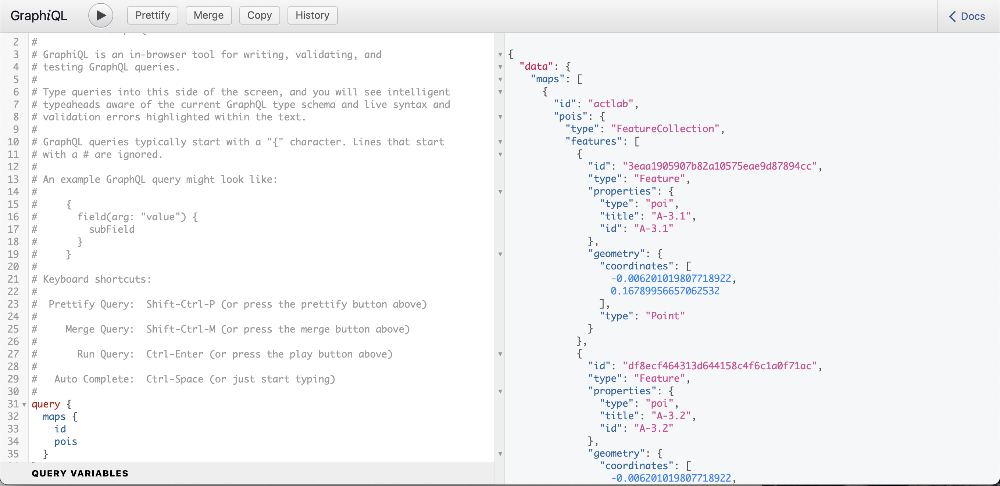

### Create Navmesh - do this when you need some mesh objects as some boundary or markers

- note that these points will not affect the experiment, they are just markers for post analysis
- Navigate to the developer website (52.77.184.100:3001) and click on the side bar to select Maps
- Load map (top-right button)
- Click on the rectangle option on the drawiung tool and draw the mesh object on the map

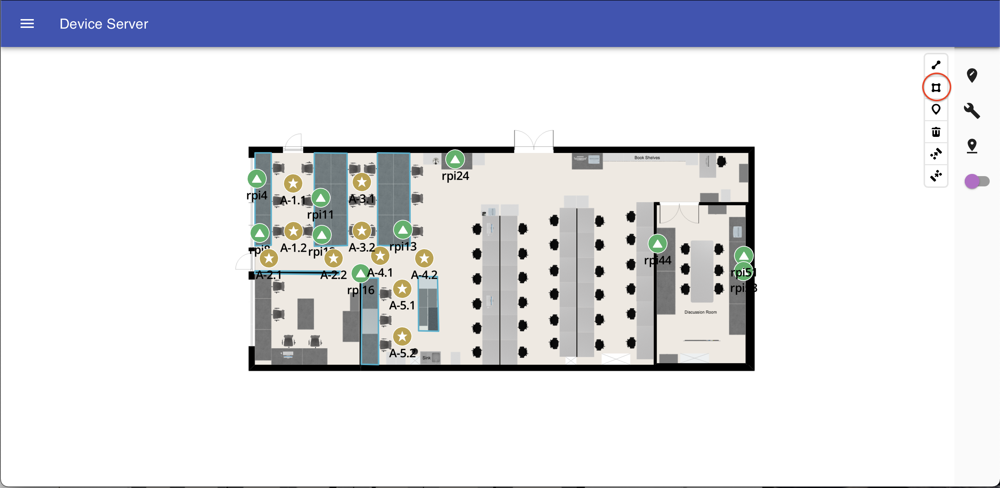

### Create Navpath - do this when you need some path as some set path or direction

- note that these points will not affect the experiment, they are just markers for post analysis
- Navigate to the developer website (52.77.184.100:3001) and click on the side bar to select Maps
- Load map (top-right button)
- Click on the line option on the drawiung tool and draw the path on the map

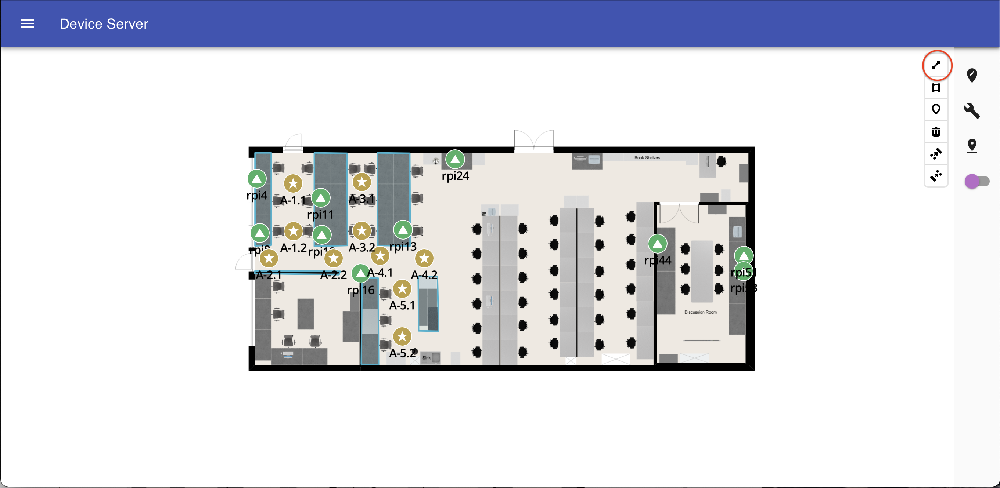

## Extracting Data (Raw, Pos)

The extraction scrpts are stored in the scripts folder of the indoor localisation project directory (/data/var/www/html/indoor-localisation-2.0/scripts/extract-data)
1. ExtractRawData.py
2. ExtractPositionData.py

- Open terminal and ensure you are in the extract-data directory
- Run the appropriate script with its required arguments

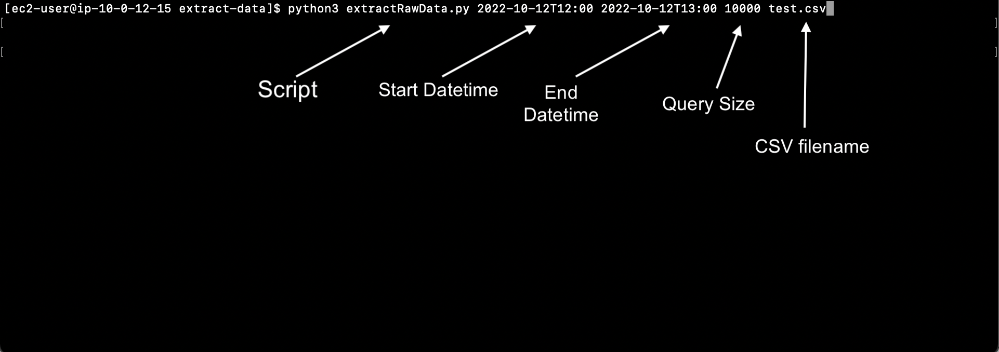